#Tree's **leaf** Training with YOLOv5

#Step 1: Install **Requirements**


In [1]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 17265, done.
remote: Total 17265 (delta 0), reused 0 (delta 0), pack-reused 17265 (from 1)
Receiving objects: 100% (17265/17265), 16.10 MiB | 9.06 MiB/s, done.
Resolving deltas: 100% (11861/11861), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 66.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 33.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.3 MB/s eta 0:00:00
   ━━━━━

#**Step** 2: Assemble Our Dataset

We must compile a dataset of representative photos with bounding box annotations surrounding the things we need to detect in order to train our custom model. Additionally, the YOLOv5 format is required for our dataset.

There are two routesi can take in Roboflow:


*Create a YOLOv5 format from an existing dataset. More than 30 object detection formats are supported by Roboflow for conversion.
*Roboflow Annotate allows to annotate raw photos in Roboflow.


In [2]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="gUN4feebSPSKAUwcbCi4")
project = rf.workspace("pds12").project("task-2-pds-12")
version = project.version(1)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Task-2:PDS-12-1 in yolov5pytorch:: 100%|██████████| 664/664 [00:00<00:00, 4023.99it/s]


#**Step 3: Train Our Custom YOLOv5 model**

In this case, we can pass several arguments:

#**img**: provide the size of the input image
#**batch**: calculate the size of the batch.

#**epochs**: specify how many training epochs there are. (Note: 3000+ are typical here.)
#**data**: The dataset contains our dataset location.location weights: give the path to the weights where transfer learning will begin. In this case, the generic COCO pretrained checkpoint is selected.
#**cache**: store pictures in the cache for quicker training


In [3]:
!python train.py --img 416 --batch 16 --epochs 15 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-01-30 11:32:36.278718: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1738236756.587582    1452 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1738236756.668572    1452 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS wh

#Evaluate Custom YOLOv5 Detector **Performance**

Training losses and performance metrics are saved to Tensorboard and also to a logfile.

In [4]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

##Run Inference With Trained Weights

Run inference with a pretrained checkpoint on contents of test/images folder downloaded from Roboflow.

In [5]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 300 --conf 0.1 --source {dataset.location}/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Task-2:PDS-12-1/test/images, data=data/coco128.yaml, imgsz=[300, 300], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-397-gde62f93c Python-3.11.11 torch-2.5.1+cu124 CPU

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ --img-size [300, 300] must be multiple of max stride 32, updating to [320, 320]
image 1/14 /content/yolov5/Task-2:PDS-12-1/test/images/IMG_20250129_170837_jpg.rf.1cc8220bac11e5f9a9632b17bd1f0630.jpg: 320x320 9 tree-leaf-detections, 129.5ms
image 2/14 /content/yolov5/Task-2:PDS-12-1/test/images/IMG_20250

#Run Inference With Trained Weights

Run inference with a pretrained checkpoint on contents of test/images folder downloaded from Roboflow.

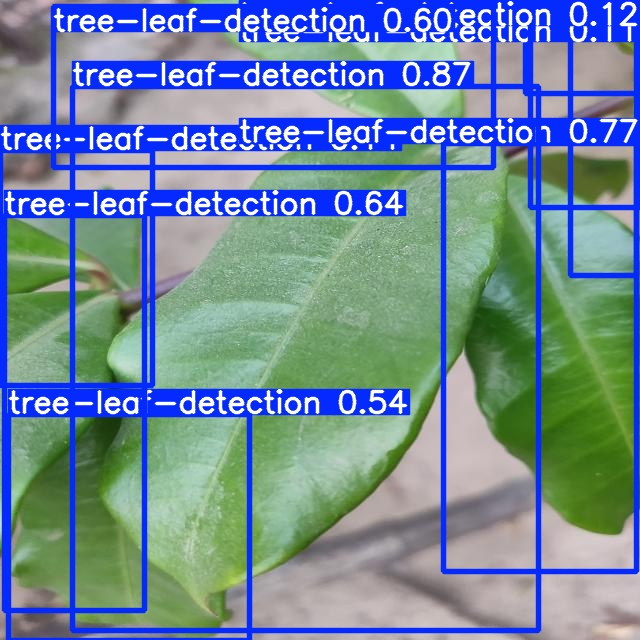

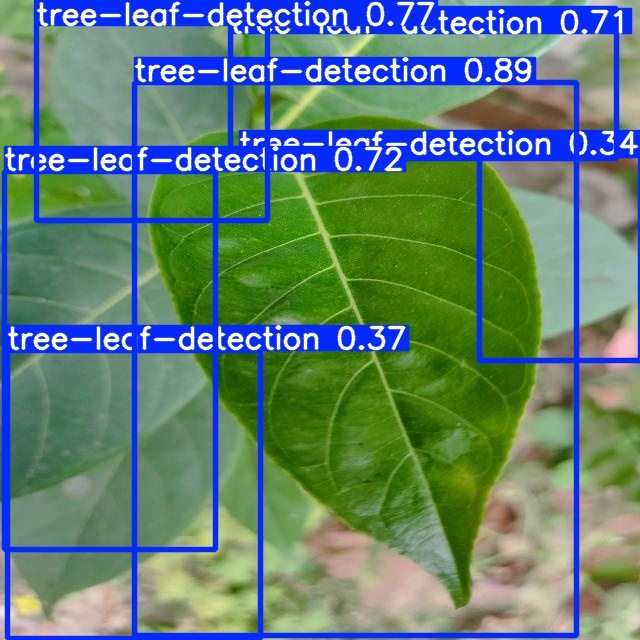

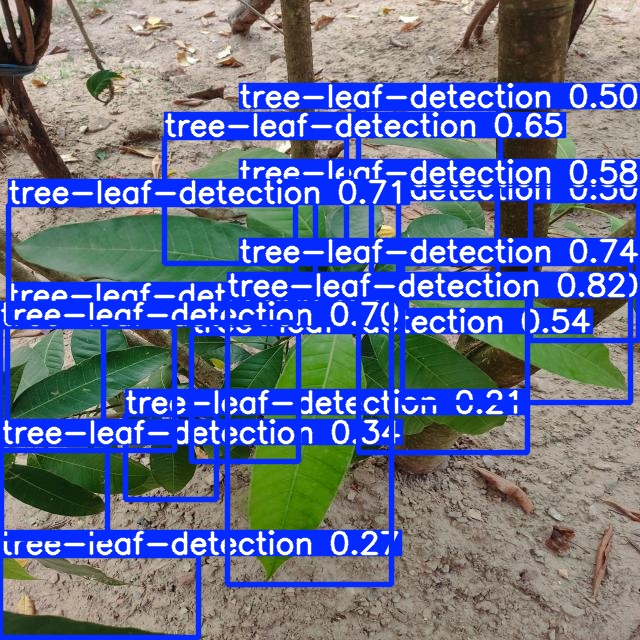

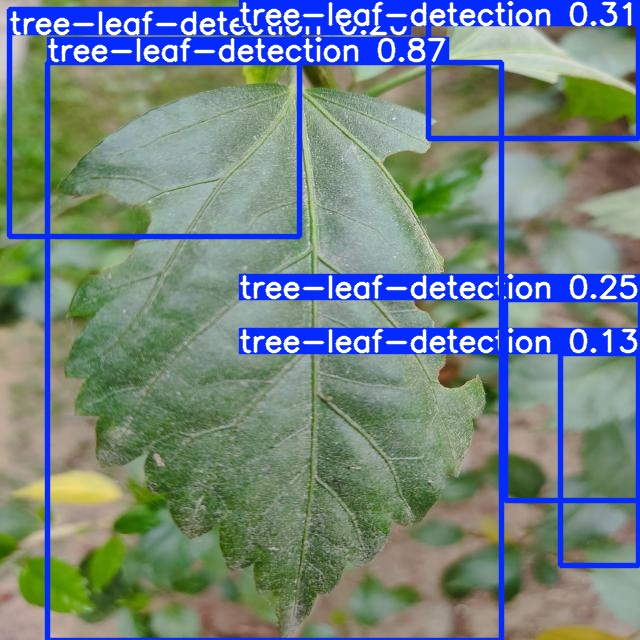

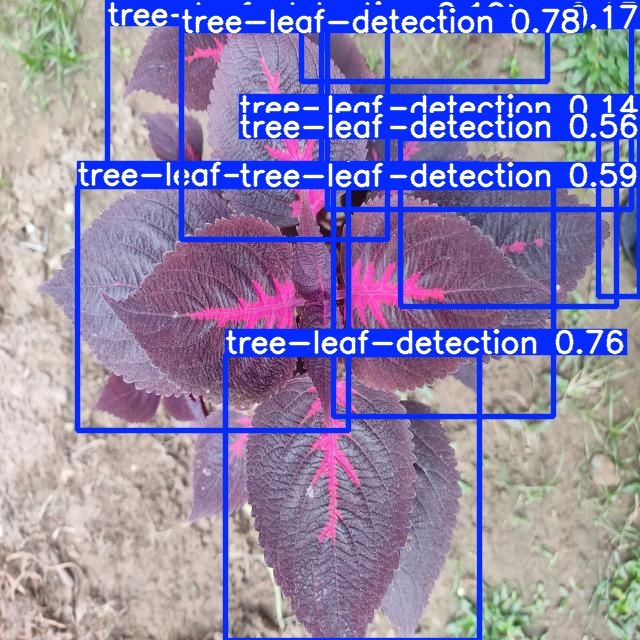

...

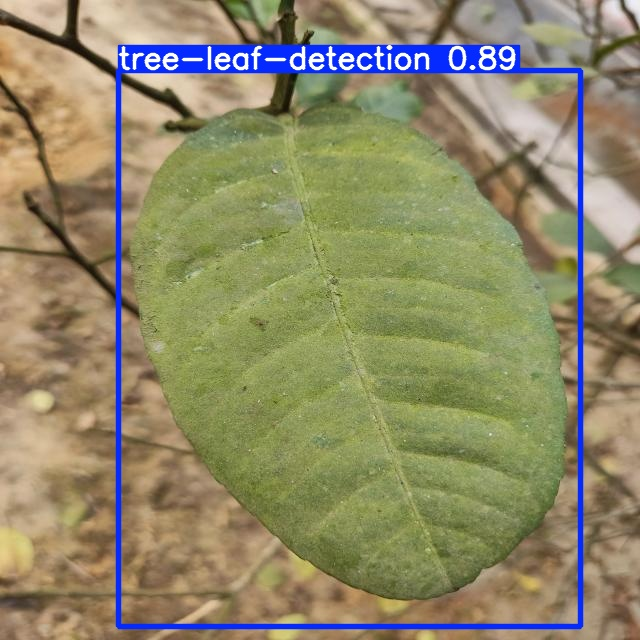

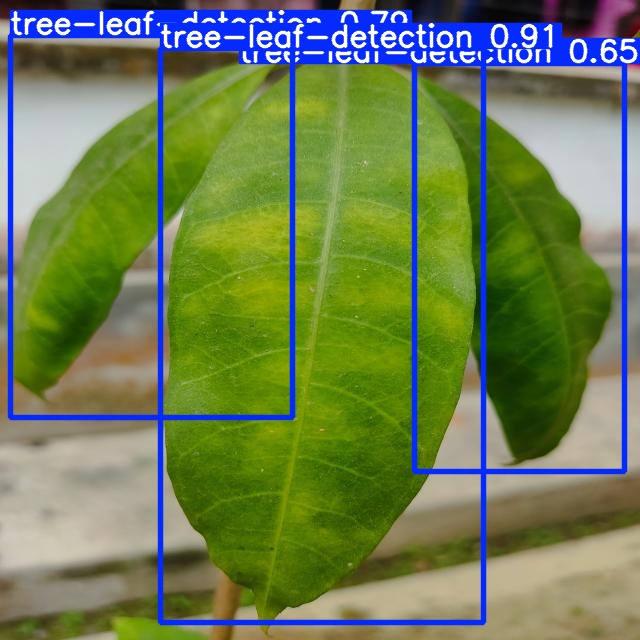

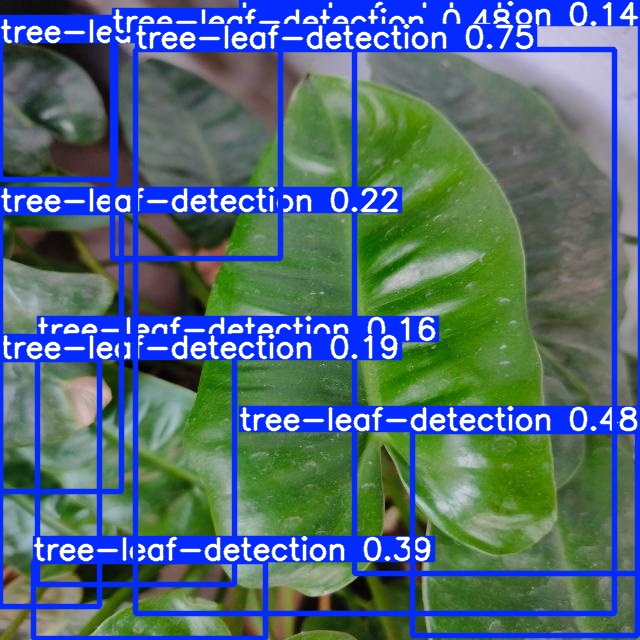

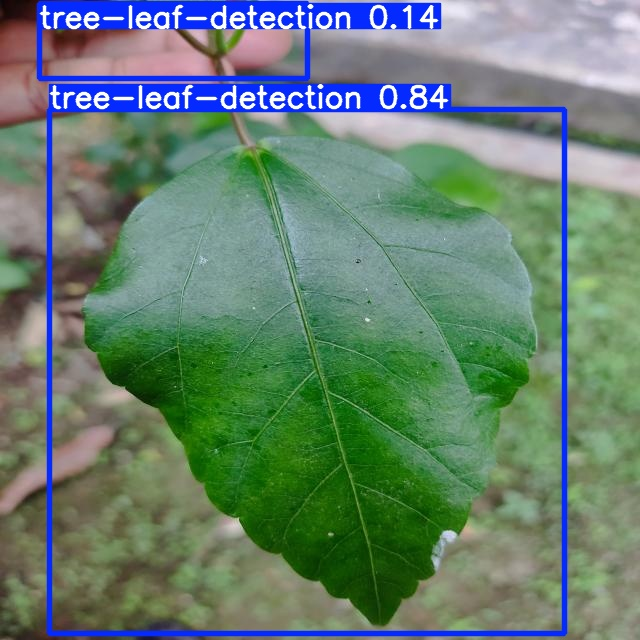

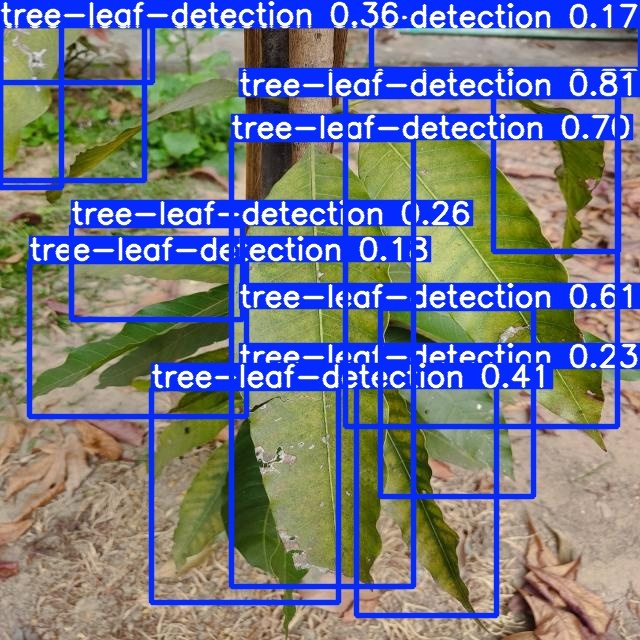

In [6]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

#Conclusion and Next **Steps**

 This is my custom leaf's tree detection in YOLOv5 model to recognize my custom objects.

In [8]:
# #export your model's weights for future use
# from google.colab import files
# files.download('./runs/train/exp/weights/best.pt')